In [1]:
'''
!pip install chart-studio
!pip install geopandas
!pip install plotly
!pip install folium
!pip install cufflinks
!pip install wordcloud
'''




'\n!pip install chart-studio\n!pip install geopandas\n!pip install plotly\n!pip install folium\n!pip install cufflinks\n!pip install wordcloud\n'

In [2]:

import numpy as np
import pandas as pd
import seaborn as sns
sns.set()
import matplotlib.pyplot as plt

import os
import json
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# mapas interactivos
import folium
from folium.plugins import FastMarkerCluster
import geopandas as gpd
from branca.colormap import LinearColormap

#to make the plotly graphs
import plotly.graph_objs as go
import chart_studio.plotly as py
from plotly.offline import iplot, init_notebook_mode
import cufflinks
cufflinks.go_offline(connected=True)
init_notebook_mode(connected=True)
import plotly.express as px

#text mining
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
import re
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from wordcloud import WordCloud



C:\Users\Javi\AppData\Local\Temp\ipykernel_2568\650244396.py:37: UserWarning:


The dash_core_components package is deprecated. Please replace
`import dash_core_components as dcc` with `from dash import dcc`

C:\Users\Javi\AppData\Local\Temp\ipykernel_2568\650244396.py:38: UserWarning:


The dash_html_components package is deprecated. Please replace
`import dash_html_components as html` with `from dash import html`



In [3]:
listings = pd.read_csv(r'C:\Users\Javi\Desktop\Bootcamp2\Proyecto_modulo_2\data\listings.csv')
listings_details = pd.read_csv(r'C:\Users\Javi\Desktop\Bootcamp2\Proyecto_modulo_2\data\listings_detailed.csv')
reviews = pd.read_csv(r'C:\Users\Javi\Desktop\Bootcamp2\Proyecto_modulo_2\data\reviews.csv')
reviews_details = pd.read_csv(r'C:\Users\Javi\Desktop\Bootcamp2\Proyecto_modulo_2\data\reviews_detailed.csv')
calendar = pd.read_csv(r'C:\Users\Javi\Desktop\Bootcamp2\Proyecto_modulo_2\data\calendar.csv')
neighbourhoods = pd.read_csv(r'C:\Users\Javi\Desktop\Bootcamp2\Proyecto_modulo_2\data\neighbourhoods.csv')

In [4]:
neighbourhoods['neighbourhood'].value_counts()

Adachi Ku          1
Ogasawara Mura     1
Machida Shi        1
Meguro Ku          1
Mikurajima Mura    1
                  ..
Kiyose Shi         1
Kodaira Shi        1
Koganei Shi        1
Kokubunji Shi      1
Toshima Mura       1
Name: neighbourhood, Length: 62, dtype: int64

In [5]:
# calendar_details = pd.read_csv(r'C:\Users\Javi\Desktop\Bootcamp\Proyecto_modulo_2\data\calendar_detailed.csv')

**Columnas y errores**

In [6]:
warnings.simplefilter(action='ignore', category=FutureWarning)
pd.set_option('display.max_columns', None)


In [7]:
listings

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,197677,Oshiage Holiday Apartment,964081,Yoshimi & Marek,NaN,Sumida Ku,35.717070,139.826080,Entire home/apt,11000,3,170,2023-03-05,1.21,1,0,5,M130003350
1,776070,Kero-kero house room 1,801494,Kei,NaN,Kita Ku,35.738440,139.769170,Private room,8336,3,235,2023-03-07,1.87,1,109,7,M130000243
2,1016831,5 mins Shibuya Cat modern sunny Shimokita,5596383,Wakana,NaN,Setagaya Ku,35.658000,139.671340,Private room,16026,1,233,2023-03-20,1.92,1,79,22,M130001107
3,1196177,Stay with host Cozy private room Senju area,5686404,Yukiko,NaN,Adachi Ku,35.744750,139.797310,Private room,40000,2,95,2020-03-17,0.81,1,88,0,M130007760
4,1249571,Unique stay! New&1min to the subway,6809418,Yume,NaN,Shibuya Ku,35.651110,139.721650,Entire home/apt,50392,7,114,2023-03-15,0.98,1,212,11,M130000957
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,851174947816411172,New Open | 4 Bedrooms | 4 Minutes to Shinjuku,6334933,Keita,NaN,Shibuya Ku,35.675251,139.665582,Entire home/apt,68000,1,1,2023-03-26,1.00,2,330,1,Hotels and Inns Business Act | 渋谷区保健所 | 4渋保生環第...
10123,851221316564828054,地下鉄三田線「板橋本町駅」徒歩6分、東京皇居直通。,34155786,寂寞的Ij,NaN,Itabashi Ku,35.758069,139.703663,Entire home/apt,10037,2,0,NaN,NaN,4,141,0,Hotels and Inns Business Act | 墨田区保健所 | 4墨福衛生環...
10124,851728395283242304,Tokyo Sunshine Tower twin room,506350896,Sunshine,NaN,Minato Ku,35.652616,139.746203,Entire home/apt,18918,1,0,NaN,NaN,3,88,0,Hotels and Inns Business Act | 港区みなと保健所 | 2港み生...
10125,851779670506848078,North Shinjuku house 12 ppl max,35519960,Y,NaN,Shinjuku Ku,35.706820,139.693485,Entire home/apt,38857,1,0,NaN,NaN,3,52,0,M130033033


In [8]:
listings.isnull().sum()

id                                    0
name                                  0
host_id                               0
host_name                             0
neighbourhood_group               10127
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                        1095
reviews_per_month                  1095
calculated_host_listings_count        0
availability_365                      0
number_of_reviews_ltm                 0
license                              26
dtype: int64

In [9]:
listings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 18 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              10127 non-null  int64  
 1   name                            10127 non-null  object 
 2   host_id                         10127 non-null  int64  
 3   host_name                       10127 non-null  object 
 4   neighbourhood_group             0 non-null      float64
 5   neighbourhood                   10127 non-null  object 
 6   latitude                        10127 non-null  float64
 7   longitude                       10127 non-null  float64
 8   room_type                       10127 non-null  object 
 9   price                           10127 non-null  int64  
 10  minimum_nights                  10127 non-null  int64  
 11  number_of_reviews               10127 non-null  int64  
 12  last_review                     

In [10]:
listings['last_review'] = pd.to_datetime(listings['last_review'])

In [11]:
listings['host_id'].value_counts()


258668827    98
247326938    62
94302731     56
321365764    54
229627088    51
             ..
270372478     1
54170559      1
268742001     1
266732995     1
505619522     1
Name: host_id, Length: 2462, dtype: int64

Hay 2439 host diferentes, a una media de 4.141451 listings por host

In [12]:
listings['host_id'].value_counts().mean()


4.1133225020308695

In [13]:
2439*4.11332250

10032.393577499999

En esta tabla hay que:
dropear
  neighbourhood_group,
encodear
  room_type
  license maybe
  neighbourhood maybe
ver nulos:
  last_review
  reviews_per_month
  license                         


In [14]:
del listings['neighbourhood_group']


# License

Buscamos los nulos de 'license'


In [15]:
listings[listings['license'].isnull()]

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
5690,44434578,Shinjuku/ Newly built/ WFH/ Quiet neighborhood,342971176,Yume,Shinjuku Ku,35.714600,139.686210,Entire home/apt,25714,1,55,2023-03-18,1.76,15,140,33,NaN
5731,44601406,ザ・ワンファイブ東京渋谷 (旧 ホテルエミット渋谷),360981919,The OneFive Tokyo Shibuya,Shibuya Ku,35.664180,139.700060,Hotel room,0,1,40,2023-03-07,1.63,1,0,7,NaN
6174,46763312,61浅草寺徒歩3分NEW Asakusa Sensoji Temple 3min Max6ppl,377917234,T Hotel,Taito Ku,35.716440,139.796750,Entire home/apt,15543,2,0,NaT,NaN,8,0,0,NaN
6180,46778474,24 谷中－人気の観光スポット直前割/千駄木駅徒歩3分/最大9名様/ wifi完備ファミリー向け,183877565,UI Home Company,Taito Ku,35.726370,139.766340,Entire home/apt,52000,2,13,2023-02-26,0.53,42,144,8,NaN
6562,48873768,1min to Iriya Sta. Vessel Inn Ueno Iriya Station,394228369,ﾍﾞｯｾﾙｲﾝ上野入谷駅前,Taito Ku,35.721855,139.787238,Hotel room,0,1,3,2021-12-26,0.18,1,0,0,NaN
6693,49354744,Residential Hotel BCONTE Asakusa,395690317,ﾚｼﾞﾃﾞﾝｼｬﾙﾎﾃﾙ ﾋﾞｰｺﾝﾃ浅草,Taito Ku,35.713245,139.794159,Hotel room,0,1,0,NaT,NaN,1,0,0,NaN
6741,49888529,Quintessa Hotel Tokyo Ginza,402320953,ｸｲﾝﾃｯｻﾎﾃﾙ東京銀座,Chuo Ku,35.670029,139.768555,Hotel room,0,1,2,2023-03-08,0.67,1,0,2,NaN
6748,49914832,Hotel Nihonbashi Saibo,402511398,ﾎﾃﾙ日本橋ｻｲﾎﾞｰ,Chuo Ku,35.685665,139.780365,Hotel room,0,1,5,2023-01-11,0.28,1,0,3,NaN
6757,49937123,Sotetsu Fressain Kanda Otemachi,402684354,相鉄ﾌﾚｯｻｲﾝ 神田大手町,Chiyoda Ku,35.690716,139.768448,Hotel room,0,1,5,2022-12-03,0.29,1,0,4,NaN
6762,49937209,Sotetsu Fresa Inn Tokyo Kanda,402685055,相鉄ﾌﾚｯｻｲﾝ 東京神田,Chiyoda Ku,35.691723,139.774017,Hotel room,0,1,4,2023-03-04,0.62,1,0,4,NaN


# Tiene 26 nulos, los cuales se corresponden a listings sin precio también, se podrían eliminar o intentar regresión para predecirlos

borramos las filas nan

In [16]:
listings = listings.dropna(subset=['license'])

Agrupamos las variables

In [17]:
listings['license'].value_counts()

Hotels and Inns Business Act | 台東区台東保健所 | 30台台健生環き第183号          88
Hotels and Inns Business Act | 東京都台東区台東保健所 | 4台台健生環き第10087号      39
M130010735                                                       32
Hotels and Inns Business Act | 東京都新宿保健所 | 30新保衛環第213号            30
Hotels and Inns Business Act | 新宿区保健所長   髙橋 　郁美 | 26新保衛環第12号     28
                                                                 ..
M130016343                                                        1
M130019256                                                        1
M130018911                                                        1
M130018909                                                        1
Hotels and Inns Business Act | 港区みなと保健所 | 2港み生環き第129号             1
Name: license, Length: 5748, dtype: int64

In [18]:
license_hotel = 'Hotels and Inns Business Act'
license_special = 'Special Economic Zoning Act'
license_M1300 = 'M1300'
license_m1300 = 'm1300'
license_M5400 = 'M5400'



In [19]:
listings.loc[listings['license'].str.contains(license_hotel), 'license'] = license_hotel

listings.loc[listings['license'].str.contains(license_special), 'license'] = license_special

listings.loc[listings['license'].str.contains(license_M1300), 'license'] = license_M1300

listings.loc[listings['license'].str.contains(license_m1300), 'license'] = license_M1300

listings.loc[listings['license'].str.contains(license_M5400), 'license'] = license_M5400

listings.loc[listings['license'].str.contains('30新保衛環第126号'), 'license'] = license_special


In [20]:
listings['license'].value_counts()

Hotels and Inns Business Act    5372
M1300                           4514
Special Economic Zoning Act      206
M5400                              9
Name: license, dtype: int64

# Encode

In [21]:
from sklearn.preprocessing import LabelEncoder

In [22]:
listings['license_encode'] = listings['license'].map({'Hotels and Inns Business Act' : 0, 'M1300' : 1, 'Special Economic Zoning Act' : 2, 'M5400' : 3})


0 = Hotel
1 = M1300
2 = Special
3 = M5400

In [23]:
listings

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license,license_encode
0,197677,Oshiage Holiday Apartment,964081,Yoshimi & Marek,Sumida Ku,35.717070,139.826080,Entire home/apt,11000,3,170,2023-03-05,1.21,1,0,5,M1300,1
1,776070,Kero-kero house room 1,801494,Kei,Kita Ku,35.738440,139.769170,Private room,8336,3,235,2023-03-07,1.87,1,109,7,M1300,1
2,1016831,5 mins Shibuya Cat modern sunny Shimokita,5596383,Wakana,Setagaya Ku,35.658000,139.671340,Private room,16026,1,233,2023-03-20,1.92,1,79,22,M1300,1
3,1196177,Stay with host Cozy private room Senju area,5686404,Yukiko,Adachi Ku,35.744750,139.797310,Private room,40000,2,95,2020-03-17,0.81,1,88,0,M1300,1
4,1249571,Unique stay! New&1min to the subway,6809418,Yume,Shibuya Ku,35.651110,139.721650,Entire home/apt,50392,7,114,2023-03-15,0.98,1,212,11,M1300,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,851174947816411172,New Open | 4 Bedrooms | 4 Minutes to Shinjuku,6334933,Keita,Shibuya Ku,35.675251,139.665582,Entire home/apt,68000,1,1,2023-03-26,1.00,2,330,1,Hotels and Inns Business Act,0
10123,851221316564828054,地下鉄三田線「板橋本町駅」徒歩6分、東京皇居直通。,34155786,寂寞的Ij,Itabashi Ku,35.758069,139.703663,Entire home/apt,10037,2,0,NaT,NaN,4,141,0,Hotels and Inns Business Act,0
10124,851728395283242304,Tokyo Sunshine Tower twin room,506350896,Sunshine,Minato Ku,35.652616,139.746203,Entire home/apt,18918,1,0,NaT,NaN,3,88,0,Hotels and Inns Business Act,0
10125,851779670506848078,North Shinjuku house 12 ppl max,35519960,Y,Shinjuku Ku,35.706820,139.693485,Entire home/apt,38857,1,0,NaT,NaN,3,52,0,M1300,1


# Room type

In [24]:
listings['room_type'].value_counts()

Entire home/apt    7117
Private room       2459
Hotel room          275
Shared room         250
Name: room_type, dtype: int64

· Entire home/apt = 0
· Private room = 1
· Shared room = 2
· Hotel room = 3

In [25]:
listings['room_type_encode'] = listings['room_type'].map({'Entire home/apt' : 0, 'Private room' : 1, 'Shared room' : 2, 'Hotel room' : 3})

## Buscamos las columnas que pueden servirnos de listings_details

In [26]:
listings.columns

Index(['id', 'name', 'host_id', 'host_name', 'neighbourhood', 'latitude',
       'longitude', 'room_type', 'price', 'minimum_nights',
       'number_of_reviews', 'last_review', 'reviews_per_month',
       'calculated_host_listings_count', 'availability_365',
       'number_of_reviews_ltm', 'license', 'license_encode',
       'room_type_encode'],
      dtype='object')

In [27]:
listings_details = listings_details.dropna(subset=['license'])

In [28]:
listings_details['id'] = listings_details['id'].astype('int64')

In [29]:
target_columns = ['host_response_time', 'host_response_rate', 'host_acceptance_rate', 'host_is_superhost', 'host_identity_verified', 'property_type', 'accommodates', 'review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness', 'review_scores_checkin', 'review_scores_communication', 'review_scores_location', 'review_scores_value', 'instant_bookable']

Creamos un nuevo dataframe con las columnas que queremos añadir al dataframe principal

In [30]:
columns_df = pd.DataFrame(listings_details[target_columns])

In [31]:
listings = pd.concat([listings, columns_df], axis=1)

## Tratamos las columnas con valores nulos, formato, encode

Pasamos las 2 columnas de porcentajes a int

In [32]:
listings['host_response_rate'] = listings['host_response_rate'].str.replace('%', '')
listings['host_acceptance_rate'] = listings['host_acceptance_rate'].str.replace('%', '')
listings['host_response_rate'] = listings['host_response_rate'].astype(float)
listings['host_acceptance_rate'] = listings['host_acceptance_rate'].astype(float)

Al tener nulos, los rellenamos con la mediana ya que define mejor la distribución de datos

In [33]:
median_response = listings['host_response_rate'].median()
median_acceptance = listings['host_acceptance_rate'].median()
listings['host_response_rate'] = listings['host_response_rate'].fillna(median_response)
listings['host_acceptance_rate'] = listings['host_acceptance_rate'].fillna(median_acceptance)


Eliminamos las 25 nuevas filas de valores nulos que se han añadido

In [34]:
listings = listings.dropna(subset=['name'])


In [35]:
listings.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10101 entries, 0 to 10126
Data columns (total 34 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   id                              10101 non-null  float64       
 1   name                            10101 non-null  object        
 2   host_id                         10101 non-null  float64       
 3   host_name                       10101 non-null  object        
 4   neighbourhood                   10101 non-null  object        
 5   latitude                        10101 non-null  float64       
 6   longitude                       10101 non-null  float64       
 7   room_type                       10101 non-null  object        
 8   price                           10101 non-null  float64       
 9   minimum_nights                  10101 non-null  float64       
 10  number_of_reviews               10101 non-null  float64       
 11  la

## Encode Neighbourhood

In [36]:
listings['neighbourhood'].value_counts()

Shinjuku Ku            2059
Taito Ku               1506
Sumida Ku              1106
Toshima Ku              849
Shibuya Ku              587
Minato Ku               375
Setagaya Ku             333
Ota Ku                  331
Nakano Ku               294
Chuo Ku                 288
Kita Ku                 261
Katsushika Ku           237
Suginami Ku             211
Koto Ku                 204
Edogawa Ku              190
Arakawa Ku              185
Bunkyo Ku               180
Shinagawa Ku            174
Itabashi Ku             156
Chiyoda Ku              151
Adachi Ku                93
Meguro Ku                57
Nerima Ku                55
Fuchu Shi                30
Hachioji Shi             19
Hino Shi                 18
Kokubunji Shi            17
Machida Shi              14
Chofu Shi                13
Akiruno Shi              12
Ome Shi                  11
Koganei Shi              10
Mitaka Shi                9
Kunitachi Shi             9
Tama Shi                  8
Musashino Shi       

Creamos una nueva columna con la frecuencia de cada neighbourhood, para despues poder ordenarla de mayor a menor y tener esta columna en object e int

In [37]:
# Calculamos la frecuencia
neighbourhood_encode = listings['neighbourhood'].value_counts()
# Asignamos la frecuencia total a cada neighbourhood diferente para poder ordenar la columna
listings['neighbourhood_encode'] = listings['neighbourhood'].map(neighbourhood_encode)
# Ordenamos la columna
listings = listings.sort_values(by='neighbourhood_encode', ascending=False)

In [38]:
le = LabelEncoder()
listings['neighbourhood_encode'] = le.fit_transform(listings['neighbourhood_encode'])


In [39]:
listings['neighbourhood_encode'].value_counts()

40    2059
39    1506
38    1106
37     849
36     587
35     375
34     333
33     331
32     294
31     288
30     261
29     237
28     211
27     204
26     190
25     185
24     180
23     174
22     156
21     151
20      93
19      57
18      55
17      30
16      19
15      18
8       18
14      17
6       14
13      14
12      13
11      12
5       12
10      11
9       10
7        8
3        8
2        6
4        5
1        2
0        2
Name: neighbourhood_encode, dtype: int64

# host_response_time              

In [40]:
listings['host_response_time'].value_counts()

within an hour        8595
within a few hours     606
within a day           282
a few days or more      50
Name: host_response_time, dtype: int64

### En primer lugar encodeamos para poder trabajar mejor con la columna

In [41]:
listings['host_response_time'] = listings['host_response_time'].map({'within an hour' : 0, 'within a few hours' : 1, 'within a day' : 2, 'a few days or more' : 3})

### Rellenamos con la moda en este caso al ser valores enteros

In [42]:
listings['host_response_time'].isnull().sum()

568

In [43]:
host_response_time_median = listings['host_response_time'].median()

In [44]:
listings['host_response_time'] = listings['host_response_time'].fillna(host_response_time_median)

In [45]:
listings['host_response_time'].isnull().sum()

0

In [46]:
listings.isnull().sum()

id                                   0
name                                 0
host_id                              0
host_name                            0
neighbourhood                        0
latitude                             0
longitude                            0
room_type                            0
price                                0
minimum_nights                       0
number_of_reviews                    0
last_review                       1089
reviews_per_month                 1089
calculated_host_listings_count       0
availability_365                     0
number_of_reviews_ltm                0
license                              0
license_encode                       0
room_type_encode                     0
host_response_time                   0
host_response_rate                   0
host_acceptance_rate                 0
host_is_superhost                   25
host_identity_verified              25
property_type                       25
accommodates             

## host_is_superhost               

In [47]:
listings['host_is_superhost'].isnull().sum()

25

In [48]:
listings['host_is_superhost'].value_counts()

f    7121
t    2955
Name: host_is_superhost, dtype: int64

In [49]:
le = LabelEncoder()
listings['host_is_superhost_encode'] = le.fit_transform(listings['host_is_superhost'])

In [50]:
listings['host_is_superhost_encode'].value_counts()

0    7121
1    2955
2      25
Name: host_is_superhost_encode, dtype: int64

Dropeamos las filas nulas que afectan a bastantes columnas

In [51]:
listings = listings.dropna(subset=['host_is_superhost'])

## host_identity_verified          

In [52]:
listings['host_identity_verified'].value_counts()

t    9365
f     711
Name: host_identity_verified, dtype: int64

In [53]:
le = LabelEncoder()
listings['host_identity_verified_encode'] = le.fit_transform(listings['host_identity_verified'])

In [54]:
listings['host_identity_verified_encode'].value_counts()

1    9365
0     711
Name: host_identity_verified_encode, dtype: int64

## Property_type                   

## Group property_type

Entire, private room, shared room, room, || hut, tiny home, farm = barn, treehouse, tent, earthen home

In [55]:
listings['property_type'].value_counts()

Entire rental unit                    5075
Entire home                           1038
Room in hotel                          767
Private room in rental unit            490
Private room in home                   481
Entire condo                           333
Entire serviced apartment              278
Room in aparthotel                     258
Room in boutique hotel                 251
Private room in hostel                 198
Room in hostel                         178
Shared room in hostel                  117
Entire villa                            95
Private room in serviced apartment      77
Entire loft                             48
Shared room in rental unit              41
Private room in condo                   38
Shared room in home                     30
Private room in ryokan                  28
Shared room in ryokan                   28
Private room in hut                     18
Entire townhouse                        17
Hut                                     15
Room in ryo

In [56]:
property_entire = 'Entire'
property_private_room = 'Private room'
property_share_room = 'Shared room'
property_room = 'Room'

In [57]:
listings.loc[listings['property_type'].str.contains(property_entire), 'property_type'] = property_entire
listings.loc[listings['property_type'].str.contains(property_private_room), 'property_type'] = property_private_room
listings.loc[listings['property_type'].str.contains(property_share_room), 'property_type'] = property_share_room
listings.loc[listings['property_type'].str.contains(property_room), 'property_type'] = property_room

In [58]:
listings['property_type'].value_counts()

Entire          6924
Room            1481
Private room    1399
Shared room      250
Hut               15
Tiny home          2
Tent               1
Treehouse          1
Farm stay          1
Barn               1
Earthen home       1
Name: property_type, dtype: int64

Drop less represented values

In [59]:
rows_property_drop = ['Tiny home', 'Tent', 'Treehouse', 'Farm stay', 'Barn', 'Earthen home']

In [60]:
listings = listings.drop(listings[listings['property_type'].isin(rows_property_drop)].index)


Encode column

In [61]:
listings['property_type_encode'] = listings['property_type'].map({'Entire' : 0, 'Room' : 1, 'Private room' : 2, 'Shared room' : 3, 'Hut' : 4})

## instant_bookable                

In [62]:
listings['instant_bookable'].value_counts()

t    7221
f    2848
Name: instant_bookable, dtype: int64

In [63]:
le = LabelEncoder()
listings['instant_bookable_encode'] = le.fit_transform(listings['instant_bookable'])

# Encodes:

license_encode

    Hotels and Inns Business Act : 0
    M1300 : 1
    Special Economic Zoning Act : 2
    M5400 : 3

room_type_encode

    Entire home/apt : 0
    Private room' : 1
    Shared room' : 2
    Hotel room' : 3

neighbourhoods_encode

    0-40

host_response_time_encode

    within an hour' : 0
    within a few hours: 1
    within a day : 2
    a few days or more : 3

host_is_superhost_encode

    0:False
    1:True

host_identity_verified_encode

    1:True
    0:False


property_type_encode

    'Entire' : 0
    'Room' : 1
    'Private room' : 2
    'Shared room' : 3
    'Hut' : 4
    
instant_bookable_encode

    1:True
    0:False


# EDA

## Distribuciones

# Price

### Calculamos los outliers

### Z score

In [64]:
listings['price'].mean()

26381.054126526964

In [65]:
from scipy.stats import zscore #Zscore calcula los outliers en el sentido de que si se encuentra más allá de X desvios std son considerados outlier

column_zscores = zscore(listings['price'])
outliers = listings[(column_zscores > 2.5) | (column_zscores < -2.5)]

outliers.value_counts().sum()

41

In [66]:
def reemplazar_outliers_iqr(listings, columnas):
    
    for columna in columnas:
        Q1 = listings[columna].quantile(0.25)
        Q3 = listings[columna].quantile(0.75)
        IQR = Q3 - Q1
        outliers = listings[(listings[columna] < (Q1 - 1.5 * IQR)) | (listings[columna] > (Q3 + 1.5 * IQR))]
        listings[columna] = np.where(listings[columna] < (Q1 - 2.5 * IQR), Q1, listings[columna])
        listings[columna] = np.where(listings[columna] > (Q3 + 2.5 * IQR), Q3, listings[columna])

In [67]:
reemplazar_outliers_iqr(listings, ['price'])

### Se decide aumentar el intervalo de desviación a 2.5 para no alterar demasiado la distribución y solo cambiar los valores más extremos

In [68]:
count=listings['review_scores_rating'].value_counts().sort_values(ascending=True)
fig = px.histogram(listings, x= 'price', nbins=30, marginal='box',
                 
                title ='Distribución de precio', template= "plotly_dark")

fig.update_layout(height=600, width=1000)

fig.show()

## Reviews_per_month

In [69]:
listings['reviews_per_month'].mean(), listings['reviews_per_month'].median()

(1.3418457085606144, 0.98)

In [70]:
from scipy.stats import zscore #Zscore calcula los outliers en el sentido de que si se encuentra más allá de X desvios std son considerados outlier

column_zscores = zscore(listings['reviews_per_month'])
outliers = listings[(column_zscores > 1.5) | (column_zscores < -1.5)]

In [71]:
outliers.value_counts().sum()

0

In [72]:
reemplazar_outliers_iqr(listings, ['reviews_per_month'])

In [73]:
# count=listings['review_scores_rating'].value_counts().sort_values(ascending=True)

fig = px.histogram(listings, x= 'reviews_per_month', nbins=30, marginal='box',
                 
                title ='Distribución de reviews_per_month', template= "plotly_dark")

fig.update_layout(height=600, width=1000)

fig.show()

# Corr (Quitar columnas que no son útiles)

In [74]:
listings.columns

Index(['id', 'name', 'host_id', 'host_name', 'neighbourhood', 'latitude',
       'longitude', 'room_type', 'price', 'minimum_nights',
       'number_of_reviews', 'last_review', 'reviews_per_month',
       'calculated_host_listings_count', 'availability_365',
       'number_of_reviews_ltm', 'license', 'license_encode',
       'room_type_encode', 'host_response_time', 'host_response_rate',
       'host_acceptance_rate', 'host_is_superhost', 'host_identity_verified',
       'property_type', 'accommodates', 'review_scores_rating',
       'review_scores_accuracy', 'review_scores_cleanliness',
       'review_scores_checkin', 'review_scores_communication',
       'review_scores_location', 'review_scores_value', 'instant_bookable',
       'neighbourhood_encode', 'host_is_superhost_encode',
       'host_identity_verified_encode', 'property_type_encode',
       'instant_bookable_encode'],
      dtype='object')

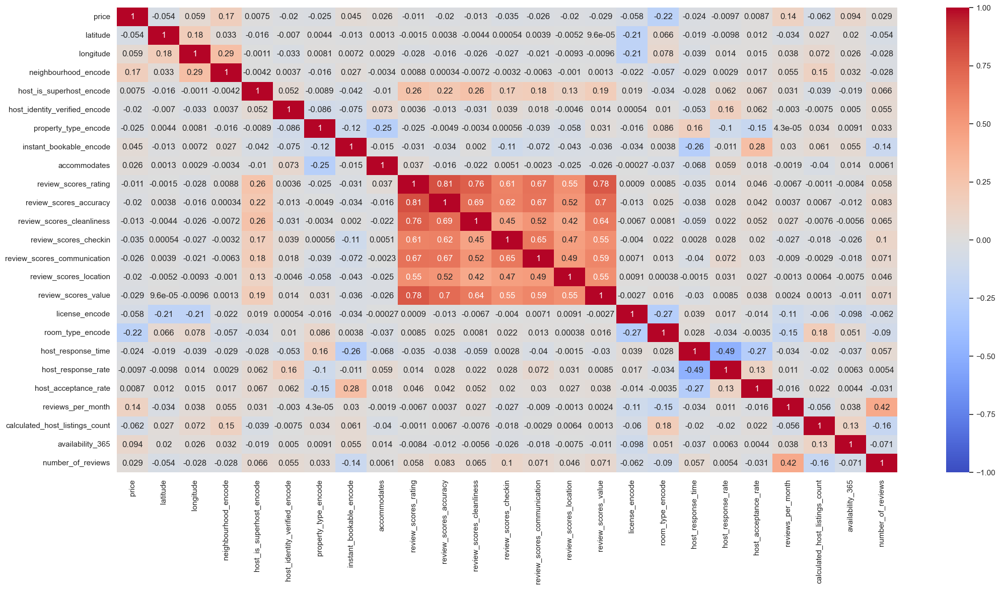

In [75]:
plt.figure(figsize=(25, 12))

columns_corr = ['price', 'latitude', 'longitude', 'neighbourhood_encode', 'host_is_superhost_encode',
       'host_identity_verified_encode', 'property_type_encode',
       'instant_bookable_encode', 'accommodates', 'review_scores_rating',
       'review_scores_accuracy', 'review_scores_cleanliness',
       'review_scores_checkin', 'review_scores_communication',
       'review_scores_location', 'review_scores_value','license_encode',
       'room_type_encode', 'host_response_time', 'host_response_rate',
       'host_acceptance_rate','reviews_per_month',
       'calculated_host_listings_count', 'availability_365','number_of_reviews']
listings_columns= listings[columns_corr]
matrix_corr = listings_columns.corr()

sns.heatmap(matrix_corr, cmap='coolwarm', vmin=-1, annot=True)

plt.show()

# Neighbourhood

In [78]:
listings['neighbourhood'].value_counts()

Shinjuku Ku            2053
Taito Ku               1494
Sumida Ku              1103
Toshima Ku              848
Shibuya Ku              586
Minato Ku               373
Setagaya Ku             332
Ota Ku                  331
Nakano Ku               294
Chuo Ku                 288
Kita Ku                 260
Katsushika Ku           236
Suginami Ku             209
Koto Ku                 204
Edogawa Ku              190
Arakawa Ku              185
Bunkyo Ku               180
Shinagawa Ku            174
Itabashi Ku             155
Chiyoda Ku              151
Adachi Ku                92
Meguro Ku                57
Nerima Ku                55
Fuchu Shi                30
Hachioji Shi             19
Hino Shi                 18
Kokubunji Shi            17
Machida Shi              14
Chofu Shi                13
Akiruno Shi              12
Ome Shi                  11
Koganei Shi              10
Kunitachi Shi             9
Mitaka Shi                9
Tama Shi                  8
Musashino Shi       

In [79]:
px.histogram(listings['neighbourhood'], title='Distribución de neighbourhood', template='plotly_dark')

In [80]:
lats = listings['latitude'].tolist()
lons = listings['longitude'].tolist()
locations = list(zip(lats, lons))

map1 = folium.Map(location=[35.67, 139.65] , zoom_start=10)
FastMarkerCluster(data=locations).add_to(map1)
map1

In [81]:
px.scatter_mapbox(listings,
                  lat='latitude',
                  lon='longitude',
                  size='price',
                  zoom=10,
                  mapbox_style='carto-positron',
                  title='AirBnb Apartment Distribution in Tokyo',
                  template= "plotly_dark",
                  size_max=5,
                  animation_frame='room_type')

## 2.2 Tipos de propiedades y habitaciones

### 2.2.1 Tipos de habitaciones


In [82]:
listings['room_type'].value_counts()

Entire home/apt    7091
Private room       2453
Hotel room          275
Shared room         250
Name: room_type, dtype: int64

In [83]:

px.histogram(listings,'room_type',
             template= 'plotly_dark',
             
             title = 'Types of room in Tokyo')

### 2.2.2 Tipos de propiedades



In [84]:
listings.property_type.unique()

array(['Entire', 'Room', 'Private room', 'Shared room', 'Hut'],
      dtype=object)

### Room_type/Property_type

In [85]:
prop = listings.groupby(['property_type','room_type']).room_type.count()
prop = prop.unstack()
prop

room_type,Entire home/apt,Hotel room,Private room,Shared room
property_type,,,,
Entire,5100.0,139.0,1526.0,159.0
Hut,10.0,1.0,4.0,NaN
Private room,902.0,35.0,420.0,42.0
Room,908.0,84.0,452.0,37.0
Shared room,171.0,16.0,51.0,12.0


In [86]:
px.bar(prop,
       barmode="group",
       color_discrete_map={"Entire home/apt":"red","Private room":"yellow","Shared room":"green"},
       template = "plotly_dark")

In [87]:
import plotly.colors

feq = listings['accommodates'].value_counts().sort_index()
num_categories = len(feq)
#Creamos un conjunto de colores para que se asignen a cada categoría, chatgpt help
colors = plotly.colors.qualitative.Dark24[:num_categories]

fig = px.bar(feq,
             title='Cantidad de personas por alojamiento en Tokyo',
             template="plotly_dark",
             labels=dict(index="Accommodates", value="Listings"),
             width=1000,
             color=colors,
             )


fig.show()


https://www.lainformacion.com/mundo/japon-restrictiva-ley-regular-alquileres-turisticos-airbnb/6350398/

https://www.smarttravel.news/airbnb-operara-en-japon-con-normalidad-tras-una-nueva-ley/

# Host with most listings

In [88]:
host_quan = listings['host_id'].value_counts().sort_index()

In [89]:
fig = px.histogram(host_quan,
                   marginal='box',
                   template='plotly_dark')

fig.show()

In [90]:
listings[listings['host_id'] == 258668827.0]

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license,license_encode,room_type_encode,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_identity_verified,property_type,accommodates,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,neighbourhood_encode,host_is_superhost_encode,host_identity_verified_encode,property_type_encode,instant_bookable_encode
2979,34553857.0,4F8【Men only】5 min to Ueno sta./ capsule hotel,258668827.0,Hiroshi,Taito Ku,35.71532,139.78210,Hotel room,3021.0,1.0,3.0,2019-08-30,0.07,98.0,280.0,0.0,Hotels and Inns Business Act,0.0,3.0,0.0,100.0,99.0,f,t,Room,1.0,4.50,5.00,4.50,5.00,5.00,5.00,5.00,t,39,0,1,1,1
2978,34553715.0,4F7【Men only】5 min to Ueno sta./ capsule hotel,258668827.0,Hiroshi,Taito Ku,35.71362,139.78196,Hotel room,3021.0,1.0,0.0,NaT,NaN,98.0,280.0,0.0,Hotels and Inns Business Act,0.0,3.0,0.0,100.0,99.0,f,t,Room,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,t,39,0,1,1,1
2975,34553374.0,4F6【Men only】5 min to Ueno sta./ capsule hotel,258668827.0,Hiroshi,Taito Ku,35.71344,139.77992,Hotel room,3021.0,1.0,0.0,NaT,NaN,98.0,280.0,0.0,Hotels and Inns Business Act,0.0,3.0,0.0,100.0,99.0,f,t,Room,1.0,4.70,4.76,4.85,4.76,4.76,4.82,4.82,t,39,0,1,1,1
2968,34518404.0,4F5【Men only】5 min to Ueno sta./ capsule hotel,258668827.0,Hiroshi,Taito Ku,35.71507,139.78168,Hotel room,3021.0,1.0,0.0,NaT,NaN,98.0,280.0,0.0,Hotels and Inns Business Act,0.0,3.0,0.0,100.0,99.0,f,t,Room,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,t,39,0,1,1,1
2963,34518361.0,5F2【Women only】5 min to Ueno sta./ capsule hotel,258668827.0,Hiroshi,Taito Ku,35.71516,139.78017,Hotel room,3021.0,1.0,0.0,NaT,NaN,98.0,280.0,0.0,Hotels and Inns Business Act,0.0,3.0,0.0,100.0,99.0,f,t,Room,1.0,4.00,5.00,5.00,4.00,5.00,5.00,5.00,t,39,0,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2878,34373733.0,"3F7【For Male】 Ueno,5mins walk to Sta!!Free WiFi",258668827.0,Hiroshi,Taito Ku,35.71551,139.78063,Hotel room,3021.0,1.0,0.0,NaT,NaN,98.0,280.0,0.0,Hotels and Inns Business Act,0.0,3.0,0.0,100.0,100.0,f,t,Entire,4.0,4.26,4.35,4.05,4.53,4.74,4.67,4.37,t,39,0,1,0,1
2882,34374491.0,"2F10【Women only】Ueno,10mins walk to Sta!!Free ...",258668827.0,Hiroshi,Taito Ku,35.71397,139.77987,Hotel room,3021.0,1.0,2.0,2019-08-05,0.04,98.0,280.0,0.0,Hotels and Inns Business Act,0.0,3.0,0.0,100.0,99.0,f,t,Entire,10.0,4.70,4.77,4.63,4.80,4.80,4.72,4.58,t,39,0,1,0,1
2883,34374652.0,"3F8【For Male】 Ueno,5mins walk to Sta!!Free WiFi",258668827.0,Hiroshi,Taito Ku,35.71344,139.78134,Hotel room,3021.0,1.0,1.0,2020-01-04,0.03,98.0,280.0,0.0,Hotels and Inns Business Act,0.0,3.0,0.0,100.0,100.0,f,t,Entire,4.0,4.55,4.79,4.71,4.84,4.95,4.55,4.61,t,39,0,1,0,1
2880,34374240.0,"2F9【Women only】 Ueno,10mins walk to Sta!!Free ...",258668827.0,Hiroshi,Taito Ku,35.71553,139.78163,Hotel room,3021.0,1.0,0.0,NaT,NaN,98.0,280.0,0.0,Hotels and Inns Business Act,0.0,3.0,1.0,83.0,67.0,f,t,Entire,3.0,4.67,4.83,4.17,5.00,5.00,5.00,5.00,f,39,0,1,0,0


In [91]:
host_private = listings.groupby(['host_id', 'host_name', 'room_type', 'property_type']).size().reset_index(name='listings').sort_values(by='listings', ascending=False)
host_private.head(20)

,host_id,host_name,room_type,property_type,listings
2509,258668827.0,Hiroshi,Hotel room,Room,49
2996,321365764.0,Japan House,Entire home/apt,Entire,46
1116,94302731.0,Alt Stay,Entire home/apt,Entire,36
2393,247326938.0,Pqd Inc Ⅱ,Entire home/apt,Entire,32
1829,197405131.0,春樹,Entire home/apt,Entire,31
2010,214640453.0,Hanako,Entire home/apt,Entire,30
2507,258668827.0,Hiroshi,Hotel room,Entire,28
3796,462816590.0,Pangoo,Entire home/apt,Entire,28
3612,415394351.0,Chi-Yuen,Entire home/apt,Entire,28
23,4838043.0,Robert,Entire home/apt,Entire,27


Investigamos al que tiene más propiedades

Vemos que tiene 98 y son habitaciones de hotel, aunque el tipo de propiedad es diferente

In [92]:
host_private[host_private['host_id'] ==258668827.0]

,host_id,host_name,room_type,property_type,listings
2509,258668827.0,Hiroshi,Hotel room,Room,49
2507,258668827.0,Hiroshi,Hotel room,Entire,28
2510,258668827.0,Hiroshi,Hotel room,Shared room,12
2508,258668827.0,Hiroshi,Hotel room,Private room,9


In [93]:
hotel_hiroshi = listings[listings['room_type'] == 'Hotel room']

hiroshi = hotel_hiroshi[hotel_hiroshi['host_id']== 258668827.0]
hiroshi = hiroshi[['name','host_id', 'host_name', 'latitude', 'longitude']]
hiroshi.index.name = "listing_id"
hiroshi

,name,host_id,host_name,latitude,longitude
listing_id,,,,,
2979,4F8【Men only】5 min to Ueno sta./ capsule hotel,258668827.0,Hiroshi,35.71532,139.78210
2978,4F7【Men only】5 min to Ueno sta./ capsule hotel,258668827.0,Hiroshi,35.71362,139.78196
2975,4F6【Men only】5 min to Ueno sta./ capsule hotel,258668827.0,Hiroshi,35.71344,139.77992
2968,4F5【Men only】5 min to Ueno sta./ capsule hotel,258668827.0,Hiroshi,35.71507,139.78168
2963,5F2【Women only】5 min to Ueno sta./ capsule hotel,258668827.0,Hiroshi,35.71516,139.78017
...,...,...,...,...,...
2878,"3F7【For Male】 Ueno,5mins walk to Sta!!Free WiFi",258668827.0,Hiroshi,35.71551,139.78063
2882,"2F10【Women only】Ueno,10mins walk to Sta!!Free ...",258668827.0,Hiroshi,35.71397,139.77987
2883,"3F8【For Male】 Ueno,5mins walk to Sta!!Free WiFi",258668827.0,Hiroshi,35.71344,139.78134


Vemos que están muy cerca, tratándose de un hotel capsula

In [94]:
#Vemos en un mapa las propiedades de Hiroshi
map2 = folium.Map(location=[35.7145, 139.78063] , zoom_start=17)
for coord in hiroshi.itertuples(index=False):
    folium.Marker((coord.latitude, coord.longitude), tooltip=coord.name).add_to(map2)
map2

# 4. Consejos al turismo

## 4.1 Precio medio por vecindario


In [95]:
#con plotly precio medio por vecindario, optra opción de hacerlo
#Creamos un df con los vecindarios, sus precios medios 
precio = listings.groupby('neighbourhood')['price'].mean().sort_values(ascending = True)
dfprecio = pd.DataFrame(precio)
dfprecio = dfprecio.reset_index()
#ahora graficamos con plotly
px.area(dfprecio, 
        x='neighbourhood',
        y='price',template = 'plotly_dark',
        title = 'Average daily price based on location in Tokyo'
        )



In [96]:
#otro ejemplo con threemap
px.treemap(dfprecio,path=['neighbourhood'],
           values='price',
           template= 'plotly_dark',
           title='Average daily price based on location in Tokyo' )

In [97]:
feq = listings.groupby('neighbourhood')['price'].mean().sort_values(ascending=True)

In [98]:
tokyo_neigh = gpd.read_file(r'C:\Users\Javi\Desktop\Bootcamp\Proyecto_modulo_2\data\neighbourhoods.geojson')
# Asegurarse de que 'feq' es un DataFrame de pandas correcto antes de transponerlo
# Si 'feq' es un DataFrame, no necesitamos encapsularlo en una lista y convertirlo a DataFrame otra vez
feq = feq.transpose()
# Mezclamos
tokyo_neigh = pd.merge(tokyo_neigh, feq, on='neighbourhood', how='left')

# Renombramos la columna
tokyo_neigh.rename(columns={'price': 'average_price'}, inplace=True)

# Redondeamos el precio
tokyo_neigh.average_price = tokyo_neigh.average_price.round(decimals=2)

# Conseguimos colores para nuestras casas 
map_dict = tokyo_neigh.set_index('neighbourhood')['average_price'].to_dict()
color_scale = LinearColormap(['yellow','red'], vmin = min(map_dict.values()), vmax = max(map_dict.values()))

def get_color(feature):
    value = map_dict.get(feature['properties']['neighbourhood'])
    if value is not None:
        return color_scale(value)
    else:
        return 'grey'  # Un color predeterminado si el barrio no está en el diccionario


In [99]:
fig = px.choropleth_mapbox(dfprecio,
                           geojson=tokyo_neigh,
                           featureidkey='properties.neighbourhood',
                           locations ="neighbourhood",
                           color = 'price',
                           color_continuous_scale="portland",
                           title="Neighbourhoods in Tokyo",
                           zoom=9, hover_data = ['neighbourhood','price'],
                           mapbox_style="carto-positron",
                           width=1000,
                           height=750,
                           center = {"lat": 35.65, "lon": 139.50}
                            )

fig.update(layout_coloraxis_showscale=True)
fig.update_layout( paper_bgcolor="#1f2630",font_color="white",title_font_size=20, title_x = 0.5)
fig.show()

In [100]:
listings[listings['neighbourhood'] == 'Kodaira Shi']

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license,license_encode,room_type_encode,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_identity_verified,property_type,accommodates,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,neighbourhood_encode,host_is_superhost_encode,host_identity_verified_encode,property_type_encode,instant_bookable_encode
3182,35696314.0,10 min. from Sta.：3駅（国分寺・西国分寺・恋ヶ窪）可能！wi-fi完備の静...,64271981.0,Osamu,Kodaira Shi,35.71629,139.46960,Private room,50000.0,1.0,10.0,2020-02-08,0.22,1.0,87.0,0.0,M1300,1.0,1.0,0.0,100.0,94.0,f,t,Entire,7.0,3.33,3.67,4.33,3.00,3.67,4.33,3.67,f,3,0,1,0,0
744,19663983.0,Musicians friendly!! with 2 Pianos＆Soundproof-...,10969488.0,Como,Kodaira Shi,35.71053,139.47909,Private room,6643.0,1.0,5.0,2023-02-21,0.10,4.0,255.0,3.0,M1300,1.0,1.0,0.0,100.0,100.0,f,t,Entire,11.0,4.59,4.70,4.60,4.87,4.73,4.75,4.55,f,3,0,1,0,0
84,6785470.0,DOMUS MUSASHINO -Sakura View-,35525878.0,Kanako,Kodaira Shi,35.72576,139.50954,Entire home/apt,5100.0,5.0,59.0,2020-03-31,0.64,1.0,37.0,0.0,M1300,1.0,0.0,0.0,100.0,96.0,t,t,Shared room,8.0,4.87,4.84,4.84,4.95,4.97,4.89,4.83,f,3,1,1,3,0
3162,35642370.0,東京都一橋学園 歡迎寵物·嬰兒·免收費,267850163.0,Mi,Kodaira Shi,35.72686,139.47679,Private room,73332.0,1.0,11.0,2021-12-23,0.25,1.0,149.0,0.0,M1300,1.0,1.0,0.0,100.0,100.0,t,t,Entire,4.0,4.56,4.78,4.66,4.63,4.84,4.59,4.31,t,3,1,1,0,1


Seguridad en tokyo, bastante seguro
https://www.securitasdirect.es/blog/ciudades-mas-seguras-del-mundo/

## SuperHost

In [101]:
listings.host_is_superhost = listings.host_is_superhost.replace({"t": "True", "f": "False"})
feq=listings['host_is_superhost'].value_counts()

fig = px.pie(feq,
       names = feq.index, 
       values=feq.values,
       hover_name=feq,
       width = 1000, 
       template= "plotly_dark", 
       title="Number of listings with Superhost")

fig.show()

In [102]:
fig = px.histogram(listings,
             x = 'review_scores_location',
             nbins=50,
             marginal='box',
             title='Location',
             labels=dict(index='Average review score', value='Number of listings'),
             template='plotly_dark'
             )

fig.update_xaxes(tickvals=[1,2,3,4, 4.5, 5], range=[0.9,5])
fig.update_yaxes(title_font=dict(size=14))

In [103]:
fig = px.histogram(listings,
             x = 'review_scores_cleanliness',
             nbins=50,
             marginal='box',
             title='Cleanliness',
             labels=dict(index='Average review score', value='Number of listings'),
             template='plotly_dark'
             )

fig.update_xaxes(tickvals=[1,2,3,4, 4.5, 5], range=[0.9,5])
fig.update_yaxes(title_font=dict(size=14))

fig.show()


In [104]:
fig = px.histogram(listings,
             x = 'review_scores_value',
             nbins=50,
             marginal='box',
             title='Value',
             labels=dict(index='Average review score', value='Number of listings'),
             template='plotly_dark'
             )

fig.update_xaxes(tickvals=[1,2,3,4, 4.5, 5], range=[0.9,5])
fig.update_yaxes(title_font=dict(size=14))

fig.show()

In [105]:
fig = px.histogram(listings,
             x = 'review_scores_communication',
             nbins=50,
             marginal='box',
             title='Communication',
             labels=dict(index='Average review score', value='Number of listings'),
             template='plotly_dark'
             )

fig.update_xaxes(tickvals=[1,2,3,4, 4.5, 5], range=[0.9,5])
fig.update_yaxes(title_font=dict(size=14))

fig.show()

In [106]:
fig = px.histogram(listings,
             x = 'review_scores_checkin',
             nbins=50,
             marginal='box',
             title='Checkin',
             labels=dict(index='Average review score', value='Number of listings'),
             template='plotly_dark'
             )

fig.update_xaxes(tickvals=[1,2,3,4, 4.5, 5], range=[0.9,5])
fig.update_yaxes(title_font=dict(size=14))

fig.show()

In [107]:
fig = px.histogram(listings,
             x = 'review_scores_accuracy',
             nbins=50,
             marginal='box',
             title='Accuracy',
             labels=dict(index='Average review score', value='Number of listings'),
             template='plotly_dark'
             )

fig.update_xaxes(tickvals=[1,2,3,4, 4.5, 5], range=[0.9,5])
fig.update_yaxes(title_font=dict(size=14))

fig.show()

In [108]:
fig = px.histogram(listings,
             x = 'host_response_rate',
             nbins=200,
           
             title='Host response rate',
             labels=dict(index='Average review score', value='Number of listings'),
             template='plotly_dark'
             )

fig.update_xaxes(tickvals=[60,70,80,90,100], range=[89,101])
fig.update_yaxes(title_font=dict(size=14))

fig.show()

In [109]:
listings

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license,license_encode,room_type_encode,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_identity_verified,property_type,accommodates,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,neighbourhood_encode,host_is_superhost_encode,host_identity_verified_encode,property_type_encode,instant_bookable_encode
8049,5.988989e+17,"#A Max 4ppl, Korean town, Kabukicho【Comptoir r...",230596939.0,Miwa,Shinjuku Ku,35.699450,139.706090,Entire home/apt,30000.0,1.0,2.0,2022-12-31,0.36,5.0,24.0,2.0,M1300,1.0,0.0,0.0,100.0,100.0,False,t,Entire,3.0,4.58,4.67,4.67,4.75,4.67,4.42,4.25,t,40,0,1,0,1
9427,8.004540e+17,"大风201，新宿商圈徒步，山手线直达涩谷原宿,3人最大入住，免费WIFI",266670311.0,Mari,Shinjuku Ku,35.701300,139.704370,Entire home/apt,18500.0,2.0,5.0,2023-03-01,2.14,11.0,158.0,5.0,M1300,1.0,0.0,0.0,100.0,100.0,True,t,Entire,1.0,5.00,5.00,5.00,4.50,5.00,4.50,4.50,t,40,1,1,0,1
2181,3.079728e+07,Cozy Vibes |BL| Loft room. Higashi-Shinjuku 5 ...,269182185.0,Sumifuku,Shinjuku Ku,35.700530,139.710900,Entire home/apt,19232.0,1.0,22.0,2023-03-30,0.43,22.0,54.0,13.0,Hotels and Inns Business Act,0.0,0.0,0.0,100.0,98.0,False,t,Entire,12.0,4.91,4.82,4.78,4.76,4.89,4.84,4.71,t,40,0,1,0,1
2182,3.079736e+07,Cozy Vibes |BL| Loft room. Higashi-Shinjuku 5 ...,269182185.0,Sumifuku,Shinjuku Ku,35.698570,139.708950,Entire home/apt,19232.0,1.0,5.0,2020-10-01,0.10,22.0,46.0,0.0,Hotels and Inns Business Act,0.0,0.0,0.0,100.0,99.0,False,t,Entire,13.0,4.86,4.86,4.81,4.86,4.86,4.81,4.38,t,40,0,1,0,1
2183,3.057250e+07,Near the Shinjuku :: Cozy Quad Room,228138663.0,Emily,Shinjuku Ku,35.701160,139.697500,Private room,8500.0,1.0,10.0,2023-02-26,1.99,11.0,26.0,10.0,Hotels and Inns Business Act,0.0,1.0,0.0,100.0,95.0,False,t,Entire,9.0,4.51,4.75,4.56,4.75,4.79,4.35,4.47,t,40,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1525,2.773614e+07,"A quiet house Y1 , Musashimurayama,Tokyo WIFI-...",183501849.0,Yoshitomo,Musashimurayama Shi,35.755460,139.399590,Private room,3500.0,1.0,27.0,2022-12-10,0.49,3.0,67.0,6.0,M1300,1.0,1.0,0.0,100.0,100.0,False,t,Entire,2.0,4.61,4.74,4.65,4.74,4.78,4.57,4.61,t,2,0,1,0,1
43,2.803972e+06,11mins to Fussa station by train and 6mins walk!,13465066.0,Tomoyuki&Maki,Akishima Shi,35.705610,139.379750,Entire home/apt,4743.0,3.0,35.0,2022-09-12,0.34,2.0,35.0,5.0,M1300,1.0,0.0,1.0,100.0,98.0,False,t,Entire,7.0,4.65,4.78,4.57,4.87,4.87,4.74,4.61,f,1,0,1,0,0
1491,2.737257e+07,11mins to Fussa station by train and 6mins walk!,13465066.0,Tomoyuki&Maki,Akishima Shi,35.705280,139.378950,Entire home/apt,4500.0,4.0,19.0,2023-03-03,0.38,2.0,5.0,5.0,M1300,1.0,0.0,0.0,100.0,90.0,True,t,Entire,3.0,4.86,4.94,4.84,4.97,4.97,4.88,4.65,f,1,1,1,0,0
9088,7.683425e+17,東京の秘境 檜原村の山の上に宿泊する,160945144.0,"Takashi,Yuko,Jun",Hinohara Mura,35.750873,139.091817,Entire home/apt,16000.0,1.0,0.0,NaT,NaN,1.0,358.0,0.0,Hotels and Inns Business Act,0.0,0.0,0.0,98.0,99.0,False,t,Entire,2.0,4.80,4.80,4.80,4.80,4.80,4.80,4.80,t,0,0,1,0,1


In [110]:
feq2 = listings['host_response_time'].value_counts()

fig = px.bar(feq2,     
             title='Host response time',
             labels=dict(index='Average review score', value='Number of listings'),
             template='plotly_dark'
             )

fig.update_xaxes(tickvals=[0,1,2,3], range=[-0.5,3.5])
fig.update_yaxes(title_font=dict(size=14))

fig.show()

In [111]:
feq2 = listings['host_acceptance_rate'].value_counts()

fig = px.bar(feq2,     
             title='host_acceptance_rate',
             labels=dict(index='Host acceptance rate', value='Number of listings'),
             template='plotly_dark'
             )

fig.update_xaxes(tickvals=[80,90,100], range=[79,101])
fig.update_yaxes(title_font=dict(size=14))

fig.show()

In [112]:
listings.instant_bookable = listings.instant_bookable.replace({"t": "True", "f": "False"})
feq=listings['instant_bookable'].value_counts()

fig = px.pie(feq,
       names = feq.index, 
       values=feq.values,
       hover_name=feq,
       width = 1000, 
       template= "plotly_dark", 
       title="Instant bookable")

fig.show()

# Relaciones

## Precio

In [113]:
fig = px.box(listings, 
             x='room_type', 
             y='price', 
             template='plotly_dark',
             title='Price per Room type')

fig.update_layout(xaxis_title='Room Type')
fig.update_layout(yaxis_title='Price')
fig.update_layout(width=1100, height=550)


fig.show()

In [114]:
listings.columns

Index(['id', 'name', 'host_id', 'host_name', 'neighbourhood', 'latitude',
       'longitude', 'room_type', 'price', 'minimum_nights',
       'number_of_reviews', 'last_review', 'reviews_per_month',
       'calculated_host_listings_count', 'availability_365',
       'number_of_reviews_ltm', 'license', 'license_encode',
       'room_type_encode', 'host_response_time', 'host_response_rate',
       'host_acceptance_rate', 'host_is_superhost', 'host_identity_verified',
       'property_type', 'accommodates', 'review_scores_rating',
       'review_scores_accuracy', 'review_scores_cleanliness',
       'review_scores_checkin', 'review_scores_communication',
       'review_scores_location', 'review_scores_value', 'instant_bookable',
       'neighbourhood_encode', 'host_is_superhost_encode',
       'host_identity_verified_encode', 'property_type_encode',
       'instant_bookable_encode'],
      dtype='object')

In [115]:
fig = px.histogram(listings,
                 x = 'review_scores_rating',
                 facet_col= 'host_is_superhost',
                 nbins=30,
                
                 title= 'Rating score by superhost',
                 template='plotly_dark'
                )

fig.show()

review_superhost_mean_true = listings.loc[listings['host_is_superhost']=='True', 'review_scores_rating'].mean()
review_superhost_mean_false = listings.loc[listings['host_is_superhost']=='False', 'review_scores_rating'].mean()

print('La media cuando es Superhost es:', review_superhost_mean_true, ' cuando no lo es:', review_superhost_mean_false)

La media cuando es Superhost es: 4.804969783149662  cuando no lo es: 4.584820097244732


## Calculamos si las distribuciones son significativamente diferentes o no

In [116]:
from scipy.stats import shapiro

Con shapiro obtenemos que las muestras siguen una distribución normal

In [117]:
review_superhost_mean_true = listings.loc[listings['host_is_superhost']=='True', 'review_scores_rating']
review_superhost_mean_false = listings.loc[listings['host_is_superhost']=='False', 'review_scores_rating']
# Comprobamos hipótesis nula de que nuestra muestra no se puede diferenciar de una normal
shapiro_test = shapiro(review_superhost_mean_true)
# Mostramos resultado
print(f"El p-valor obtenido en el test de Shapiro-Wilk para superhost=True es de {shapiro_test[1]}")
# Comprobamos hipótesis nula de que nuestra muestra no se puede diferenciar de una normal
shapiro_test = shapiro(review_superhost_mean_false)
# Mostramos resultado
print(f"El p-valor obtenido en el test de Shapiro-Wilk para superhost=False es de {shapiro_test[1]}")

El p-valor obtenido en el test de Shapiro-Wilk para superhost=True es de 1.0
El p-valor obtenido en el test de Shapiro-Wilk para superhost=False es de 1.0


c:\Users\Javi\Desktop\Bootcamp\Bootcamp\lib\site-packages\scipy\stats\_morestats.py:1816: UserWarning:

p-value may not be accurate for N > 5000.



Con la prueba T obtenemos que las diferencias en la media son significativas

In [118]:
from scipy.stats import ttest_ind
data1 = review_superhost_mean_false.dropna()
data2 = review_superhost_mean_true.dropna()

stat, p = ttest_ind(data1, data2)
print('stat=%.3f, p=%.3f' % (stat, p))
if p > 0.05:
	print('Probablemente tengan la misma media')
else:
	print('Probablemente tengan distinta media')

stat=-25.277, p=0.000
Probablemente tengan distinta media


calculamos la media de accomodates por property_type

In [119]:
prop_accom_mean = listings.groupby('property_type')['accommodates'].mean()
fig = px.bar(prop_accom_mean,
                 title= 'Property type mean accommodates',
                 template='plotly_dark'
                )

fig.show()

Calculamos la media de precios dependiendo el room_type

In [120]:
room_price_mean = listings.groupby('room_type')['price'].mean()
num_categories = len(room_price_mean)
#Creamos un conjunto de colores para que se asignen a cada categoría, chatgpt help
colors = plotly.colors.qualitative.Dark24[:num_categories]

fig = px.bar(room_price_mean,
             title='Mean price per room',
             template="plotly_dark",
             labels=dict(index="room type", value="price"),
             width=1000,
             color=colors,
             )


fig.show()

In [121]:
book_response_mean = listings.groupby('instant_bookable')['host_response_time'].mean()
num_categories = len(book_response_mean)
#Creamos un conjunto de colores para que se asignen a cada categoría, chatgpt help
colors = plotly.colors.qualitative.Dark24[:num_categories]

fig = px.bar(book_response_mean,
             title='Mean response time per instant bookable',
             template="plotly_dark",
             labels=dict(index="Instant bookable", value="Time"),
             width=1000,
             color=colors,
             )


fig.show()

In [122]:
book_accept_mean = listings.groupby('instant_bookable')['host_acceptance_rate'].mean()
num_categories = len(book_accept_mean)
#Creamos un conjunto de colores para que se asignen a cada categoría, chatgpt help
colors = plotly.colors.qualitative.Dark24[:num_categories]

fig = px.bar(book_accept_mean,
             title='Mean response acceptance per instant bookable',
             template="plotly_dark",
             labels=dict(index="Instant bookable", value="Acceptance rate"),
             width=1000,
             color=colors,
             )


fig.show()

In [123]:
time_rate_mean = listings.groupby('host_response_time')['host_response_rate'].mean()
num_categories = len(time_rate_mean)
#Creamos un conjunto de colores para que se asignen a cada categoría, chatgpt help
colors = plotly.colors.qualitative.Dark24[:num_categories]

fig = px.bar(time_rate_mean,
             title='Response rate per response time',
             template="plotly_dark",
             labels=dict(index="response time", value="Response rate"),
             width=1000,
             color=colors,
             )
fig.update_xaxes(tickvals=[0,1,2,3], range=[-0.5,3.5])

fig.show()

In [124]:

fig = px.scatter(listings,
                 y= 'number_of_reviews',
                 x= 'reviews_per_month',
                 title='Total reviews per reviews per month',
                 template="plotly_dark",
                 trendline='ols',
                 trendline_color_override='red',
                 color='price'

      
             
             )


fig.show()

# Crear el nuevo excel

In [125]:
# listings.to_csv('listings_tokyo.csv')


# Fin

In [126]:
listings['listing_id'] = listings['id']

In [127]:
reviews_details = pd.merge(reviews_details, listings[['listing_id', 'host_id', 'host_name', 'name']], on = 'listing_id', how = "left")
reviews_details = reviews_details[['listing_id', 'name', 'host_id', 'host_name', 'date', 'reviewer_id', 'reviewer_name', 'comments']]
reviews_details.head()

,listing_id,name,host_id,host_name,date,reviewer_id,reviewer_name,comments
0,197677,Oshiage Holiday Apartment,964081.0,Yoshimi & Marek,2011-09-21,1002142,Pablo,Couldn’t get any better!\r<br/>\r<br/>The apar...
1,197677,Oshiage Holiday Apartment,964081.0,Yoshimi & Marek,2011-10-14,1031940,Ana & Ricardo,The apartment is bigger than it looks in the p...
2,197677,Oshiage Holiday Apartment,964081.0,Yoshimi & Marek,2011-11-21,1097040,Samuel,The appartement is perfect for a couple! It is...
3,197677,Oshiage Holiday Apartment,964081.0,Yoshimi & Marek,2011-11-30,1183674,Lisa,We had a terrific stay at Yoshimi and Marek's ...
4,197677,Oshiage Holiday Apartment,964081.0,Yoshimi & Marek,2012-01-09,1538004,Langan,We loved our stay at the Oshiage Holiday Apart...


In [128]:
host_reviews = reviews_details.groupby(['host_id', 'host_name']).size().sort_values(ascending=False).to_frame(name = "number_of_reviews")
host_reviews.head()

,,number_of_reviews
host_id,host_name,
41013044.0,Aileen,3567
30883070.0,Takeshi,3400
33879810.0,Itoe,2567
42244167.0,Hiro,2425
20833491.0,David,2361


In [129]:
reviews_details.comments.head()

0    Couldn’t get any better!\r<br/>\r<br/>The apar...
1    The apartment is bigger than it looks in the p...
2    The appartement is perfect for a couple! It is...
3    We had a terrific stay at Yoshimi and Marek's ...
4    We loved our stay at the Oshiage Holiday Apart...
Name: comments, dtype: object

In [130]:
reviews_details.comments.values[2] #print comment with numbers and windows line break

'The appartement is perfect for a couple! It is a bit small but the really furniture which is really complete makes up for it, everything you need in tne everyday life is provided! We also enjoyed  the neighbourhood a lot, it is a charming place close to the principal cities of tokyo.\r<br/>Thanks for letting us stay, we will visit again!'

Preprocesamiento

In [131]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Javi\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [132]:
#take out empty comments (530)
reviews_details = reviews_details[reviews_details['comments'].notnull()]

#remove numbers
reviews_details['comments'] = reviews_details['comments'].str.replace('\d+', '') 
#all to lowercase
reviews_details['comments'] = reviews_details['comments'].str.lower()
#remove windows new line
reviews_details['comments'] = reviews_details['comments'].str.replace('\r\n', "")
#remove stopwords (from nltk library)
stop_english = stopwords.words("english")
reviews_details['comments'] = reviews_details['comments'].apply(lambda x: " ".join([i for i in x.split() 
                                                      if i not in (stop_english)]))
# remove punctuation
reviews_details['comments'] = reviews_details['comments'].str.replace('[^\w\s]'," ")
# replace x spaces by one space
reviews_details['comments'] = reviews_details['comments'].str.replace('\s+', ' ')

reviews_details.comments.values[2] #print same comments again

'appartement perfect couple bit small really furniture really complete makes it everything need tne everyday life provided also enjoyed neighbourhood lot charming place close principal cities tokyo br thanks letting us stay visit again '

In [133]:
texts = reviews_details.comments.tolist()

vec = CountVectorizer().fit(texts)
bag_of_words = vec.transform(texts)
sum_words = bag_of_words.sum(axis=0)
words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]

cvec_df = pd.DataFrame.from_records(words_freq, columns= ['words', 'counts']).sort_values(by="counts", ascending=False)
cvec_df.head(10)

,words,counts
3,br,257144
90,place,102625
6,great,80463
96,stay,78285
140,location,59919
60,station,58876
39,clean,57311
76,tokyo,49896
137,nice,42529
151,good,42512


In [134]:
cvec_df = cvec_df.drop(cvec_df[cvec_df['words'] == 'br'].index)


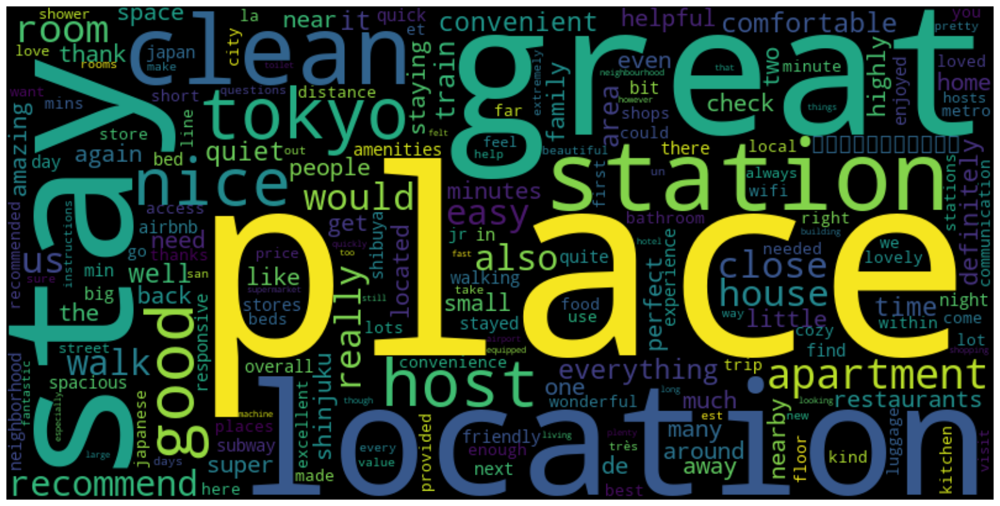

In [135]:
cvec_dict = dict(zip(cvec_df.words, cvec_df.counts))

wordcloud = WordCloud(width=800, height=400)
wordcloud.generate_from_frequencies(frequencies=cvec_dict)
plt.figure( figsize=(20,10) )
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

In [136]:
# reviews_details.to_csv('reviews_details_tokyo.csv')


# Legal

https://notesofnomads.com/airbnb-in-japan/